# Predictive-Modelling-Using-Social-Profile-in-Online-P2P-Lending-Portal

## Importing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
data= pd.read_csv(r'prosperLoanData.csv')


In [3]:
def data_info (data):
    column = []
    dtype = []
    nunique = []
    unique = []
    nulls = []
    
    for col in data.columns:
        column.append(col)
        dtype.append(data[col].dtype)
        nunique.append(data[col].nunique())
        unique.append(data[col].unique())
        nulls.append(data[col].isna().sum())

    data_info = {'Column' : column , 'Data Type' :dtype ,'nunique':nunique, 'unique':unique 
                , 'Nulls' : nulls }
    data = pd.DataFrame(data_info)
    return data

In [4]:
pd.set_option('display.max_columns', None)
data_info(data)

,Column,Data Type,nunique,unique,Nulls
0,ListingKey,object,113066,"[1021339766868145413AB3B, 10273602499503308B22...",0
1,ListingNumber,int64,113066,"[193129, 1209647, 81716, 658116, 909464, 10748...",0
2,ListingCreationDate,object,113064,"[2007-08-26 19:09:29.263000000, 2014-02-27 08:...",0
3,CreditGrade,object,8,"[C, nan, HR, AA, D, B, E, A, NC]",84984
4,Term,int64,3,"[36, 60, 12]",0
...,...,...,...,...,...
76,PercentFunded,float64,719,"[1.0, 0.7731, 0.9247, 0.7926, 0.9722, 0.8386, ...",0
77,Recommendations,int64,17,"[0, 2, 1, 4, 3, 9, 5, 16, 39, 21, 7, 14, 8, 6,...",0
78,InvestmentFromFriendsCount,int64,14,"[0, 1, 2, 9, 4, 3, 33, 20, 15, 5, 6, 13, 8, 7]",0
79,InvestmentFromFriendsAmount,float64,726,"[0.0, 789.59, 1100.0, 100.0, 1058.77, 6101.0, ...",0


In [5]:
pd.set_option('display.max_columns', None)
data

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanKey,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MemberKey,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,NaN,NaN,NaN,NaN,NaN,NaN,0,CO,Other,Self-employed,2.0,True,True,NaN,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,"$25,000-49,999",True,3083.333333,E33A3400205839220442E84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,78,19141,9425,2007-09-12 00:00:00,Q3 2007,1F3E3376408759268057EDA,330.43,11396.1400,9425.00,1971.1400,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,A,7.0,2,CO,Professional,Employed,44.0,False,False,NaN,2014-02-27 08:28:14,680.0,699.0,1996-03-18 00:00:00,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,"$50,000-74,999",True,6125.000000,9E3B37071505919926B1D82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,134815,10000,2014-03-03 00:00:00,Q1 2014,1D13370546739025387B2F4,318.93,0.0000,0.00,0.0000,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,NaN,NaN,NaN,NaN,NaN,NaN,0,GA,Other,Not available,NaN,False,True,783C3371218786870A73D20,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,NaN,NaN,3.0,0,0.0,0.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,Not displayed,True,2083.333333,6954337960046817851BCB2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,86,6466,3001,2007-01-17 00:00:00,Q1 2007,5F7033715035555618FA612,123.32,4186.6300,3001.00,1185.6300,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,A,9.0,16,GA,Skilled Labor,Employed,113.0,True,False,NaN,2012-10-22 11:02:32,800.0,819.0,1983-02-28 00:00:00,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,"$25,000-49,999",True,2875.000000,A0393664465886295619C51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,16,77296,10000,2012-11-01 00:00:00,Q4 2012,9ADE356069835475068C6D2,321.45,5143.2000,4091.09,1052.1100,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,0.18316,0.0925,0.0906

In [6]:
data.describe()

,ListingNumber,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,ListingCategory (numeric),EmploymentStatusDuration,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
count,1.139370e+05,113937.000000,113912.000000,113937.000000,113937.000000,84853.000000,84853.000000,84853.000000,84853.000000,84853.000000,113937.000000,106312.000000,113346.000000,113346.000000,106333.000000,106333.000000,113240.000000,113937.00000,113937.000000,113240.000000,112778.000000,113240.000000,106315.000000,112947.000000,113240.000000,106333.000000,1.063330e+05,106333.000000,106393.000000,106393.000000,106393.000000,106393.000000,105383.000000,1.139370e+05,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,18928.000000,113937.000000,16952.000000,113937.000000,113937.000000,113937.00000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000
mean,6.278857e+05,40.830248,0.218828,0.192764,0.182701,0.168661,0.080306,0.096068,4.072243,5.950067,2.774209,96.071582,685.567731,704.567731,10.317192,9.260164,26.754539,6.96979,398.292161,1.435085,5.584405,0.592052,984.507059,4.154984,0.312646,0.015094,1.759871e+04,0.561309,11210.225447,23.230034,0.885897,0.802327,0.275947,5.608026e+03,1.421100,22.934345,22.271949,0.613629,0.048540,8472.311961,2930.313906,-3.223214,152.816539,16.268464,31.896882,69444.474271,8337.01385,272.475783,4183.079489,3105.536588,1077.542901,-54.725641,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.023460,16.550751,80.475228
std,3.280762e+05,10.436212,0.080364,0.074818,0.074516,0.068467,0.046764,0.030403,1.673227,2.376501,3.996797,94.480605,66.458275,66.458275,5.457866,5.022644,13.637871,4.63097,447.159711,2.437507,6.429946,1.978707,7158.270157,10.160216,0.727868,0.154092,3.293640e+04,0.317918,19818.361309,11.871311,0.148179,1.097637,0.551759,7.478497e+03,0.764042,19.249584,18.830425,2.446827,0.556285,7395.507650,3806.635075,50.063567,466.320254,9.005898,29.974184,38930.479610,6245.80058,192.697812,4790.907234,4069.527670,1183.414168,60.675425,109.232758,2388.513831,2357.167068,275.657937,0.017919,0.332353,0.232412,294.545422,103.239020
min,4.000000e+00,12.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,1.000000,0.000000,0.000000,0.000000,19.000000,0.000000,0.000000,2.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-209.000000,0.000000,0.000000,0.000000,1.000000,1000.00000,0.000000,-2.349900,0.000000,-2.349900,-664.870000,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.000000,0.000000,1.000000
25%,4.009190e+05,36.000000

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  EstimatedLoss

##  Missing Values 

### 1. Null Values 

In [8]:
pd.set_option('display.max_rows', 500)
data.isnull().sum()


ListingKey                                  0
ListingNumber                               0
ListingCreationDate                         0
CreditGrade                             84984
Term                                        0
LoanStatus                                  0
ClosedDate                              58848
BorrowerAPR                                25
BorrowerRate                                0
LenderYield                                 0
EstimatedEffectiveYield                 29084
EstimatedLoss                           29084
EstimatedReturn                         29084
ProsperRating (numeric)                 29084
ProsperRating (Alpha)                   29084
ProsperScore                            29084
ListingCategory (numeric)                   0
BorrowerState                            5515
Occupation                               3588
EmploymentStatus                         2255
EmploymentStatusDuration                 7625
IsBorrowerHomeowner               

#### Fill null values in numerical columns with the mean and Fill null values in categorical columns with the mode


In [9]:
num_cols = data.select_dtypes(include=['float64', 'int64']).columns
data[num_cols] = data[num_cols].fillna(data[num_cols].mean())

cat_cols = data.select_dtypes(include=['category','object']).columns
data[cat_cols] = data[cat_cols].fillna(data[cat_cols].mode().iloc[0])

In [10]:
data.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanKey,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MemberKey,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,0.168661,0.080306,0.096068,4.072243,C,5.950067,0,CO,Other,Self-employed,2.000000,True,True,783C3371218786870A73D20,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.000000,4.000000,12.0,1,24.0,3.0,3.0,2.0,472.000000,4.0,0.0,0.000000,0.000000,0.000000,1500.000000,11.000000,0.810000,0.000000,0.17,"$25,000-49,999",True,3083.333333,E33A3400205839220442E84,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0,16.268464,78,19141,9425,2007-09-12 00:00:00,Q3 2007,1F3E3376408759268057EDA,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,C,36,Current,2014-03-04 00:00:00,0.12016,0.0920,0.0820,0.079600,0.024900,0.054700,6.000000,A,7.000000,2,CO,Professional,Employed,44.000000,False,False,783C3371218786870A73D20,2014-02-27 08:28:14,680.0,699.0,1996-03-18 00:00:00,14.000000,14.000000,29.0,13,389.0,3.0,5.0,0.0,0.000000,0.0,1.0,0.000000,3989.000000,0.210000,10266.000000,29.000000,1.000000,2.000000,0.18,"$50,000-74,999",True,6125.000000,9E3B37071505919926B1D82,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0,16.268464,0,134815,10000,2014-03-03 00:00:00,Q1 2014,1D13370546739025387B2F4,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,0.168661,0.080306,0.096068,4.072243,C,5.950067,0,GA,Other,Not available,96.071582,False,True,783C3371218786870A73D20,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,10.317192,9.260164,3.0,0,0.0,0.0,1.0,1.0,984.507059,0.0,0.0,0.015094,17598.706751,0.561309,11210.225447,23.230034,0.885897,0.802327,0.06,Not displayed,True,2083.333333,6954337960046817851BCB2,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0,16.268464,86,6466,3001,2007-01-17 00:00:00,Q1 2007,5F7033715035555618FA612,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,C,36,Current,2014-03-04 00:00:00,0.12528,0.0974,0.0874,0.084900,0.024900,0.060000,6.000000,A,9.000000,16,GA,Skilled Labor,Employed,113.000000,True,False,783C3371218786870A73D20,2012-10-22 11:02:32,800

In [11]:
pd.set_option('display.max_rows', 500)
data.isnull().sum()

ListingKey                             0
ListingNumber                          0
ListingCreationDate                    0
CreditGrade                            0
Term                                   0
LoanStatus                             0
ClosedDate                             0
BorrowerAPR                            0
BorrowerRate                           0
LenderYield                            0
EstimatedEffectiveYield                0
EstimatedLoss                          0
EstimatedReturn                        0
ProsperRating (numeric)                0
ProsperRating (Alpha)                  0
ProsperScore                           0
ListingCategory (numeric)              0
BorrowerState                          0
Occupation                             0
EmploymentStatus                       0
EmploymentStatusDuration               0
IsBorrowerHomeowner                    0
CurrentlyInGroup                       0
GroupKey                               0
DateCreditPulled

### 2. Outliers

/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar fle

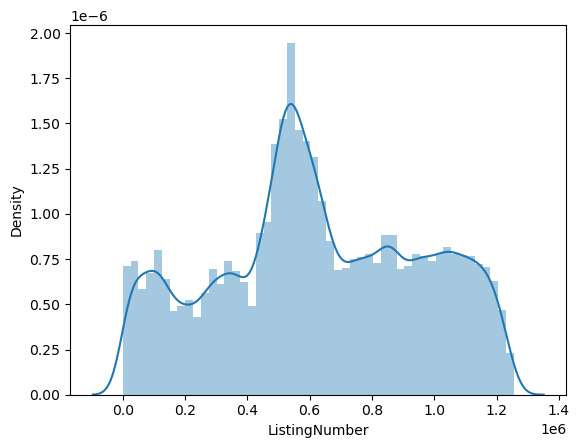

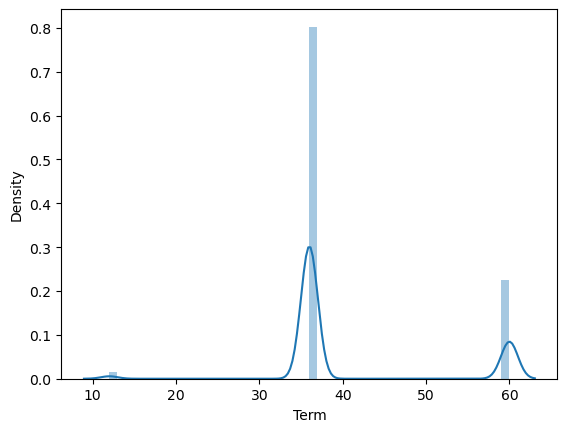

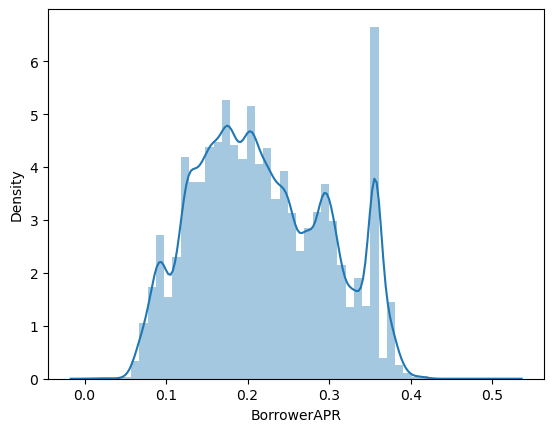

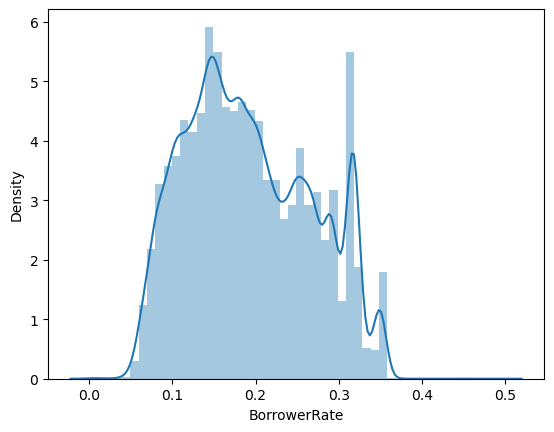

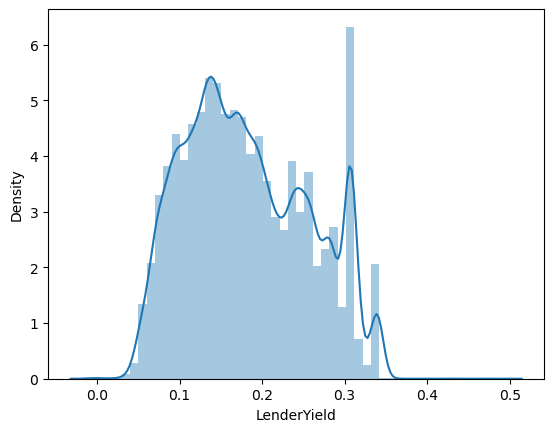

...

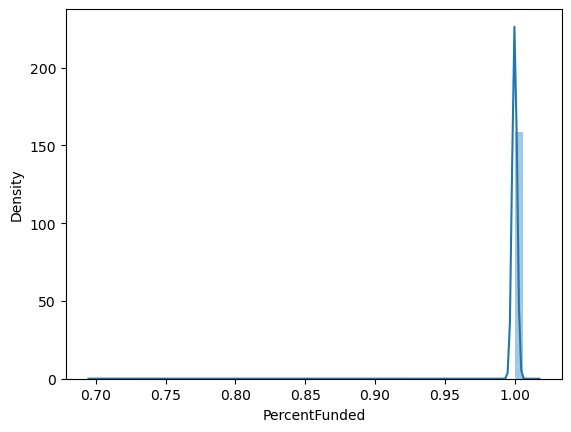

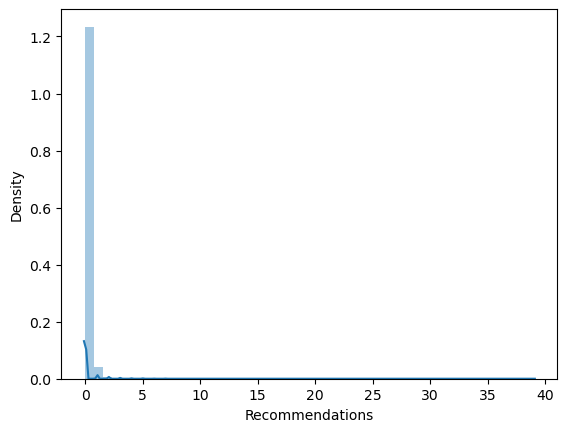

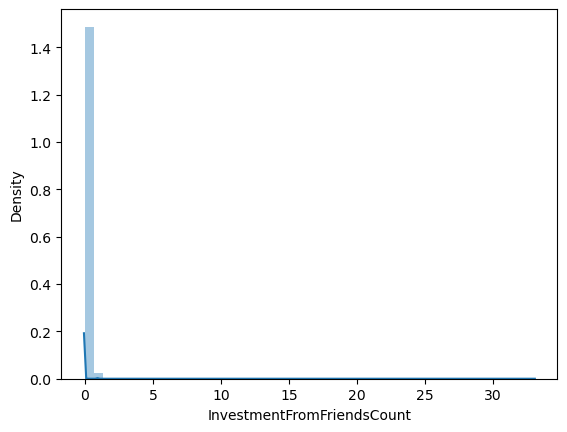

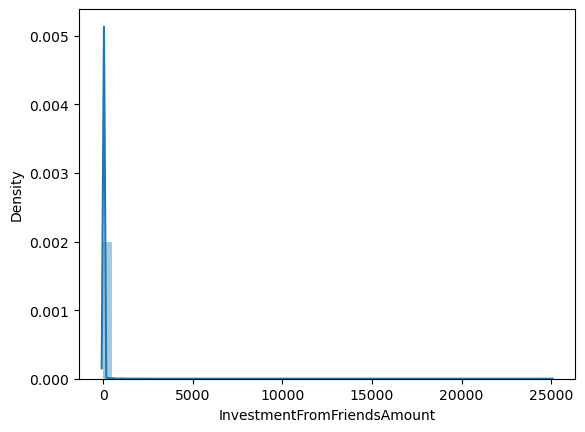

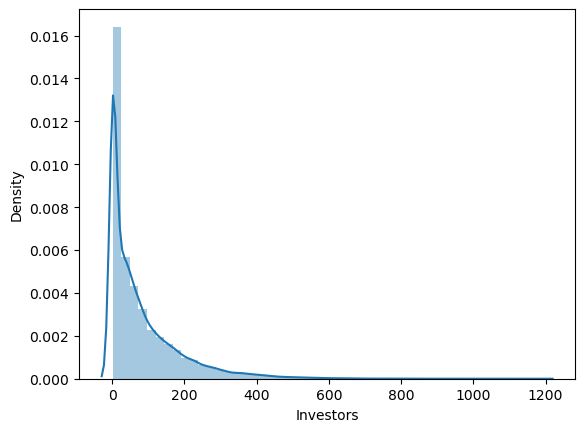

In [12]:
for i in num_cols:
    plt.figure()
    sns.distplot(data[i])

/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/ahmed/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.w

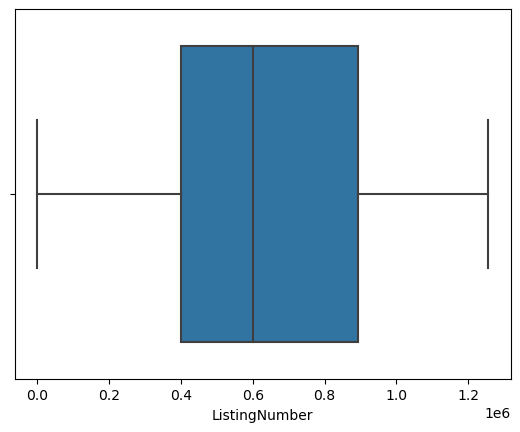

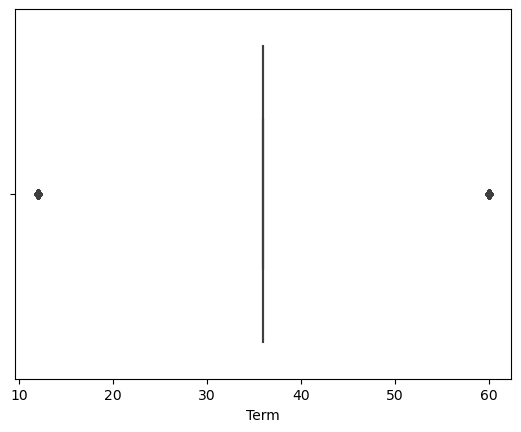

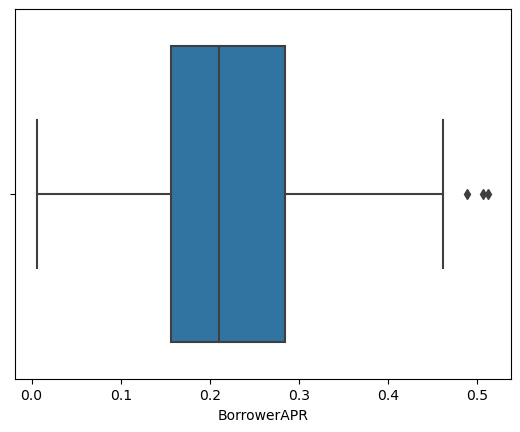

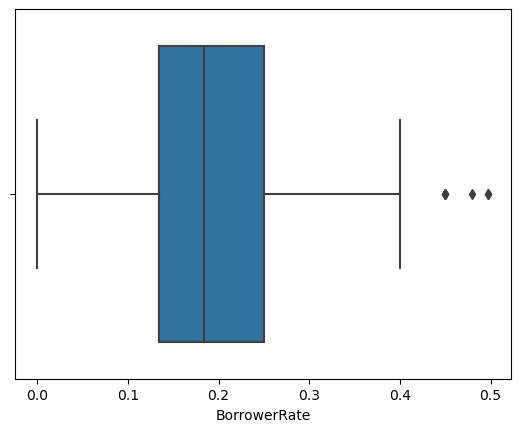

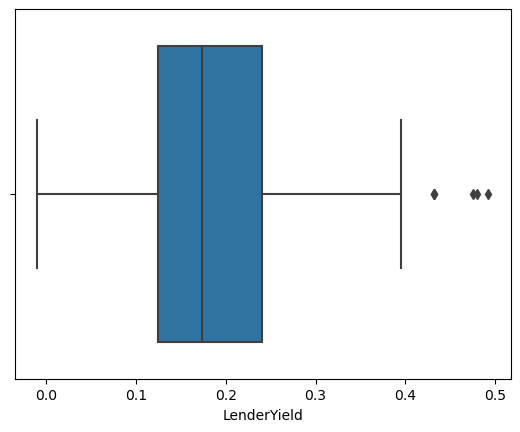

...

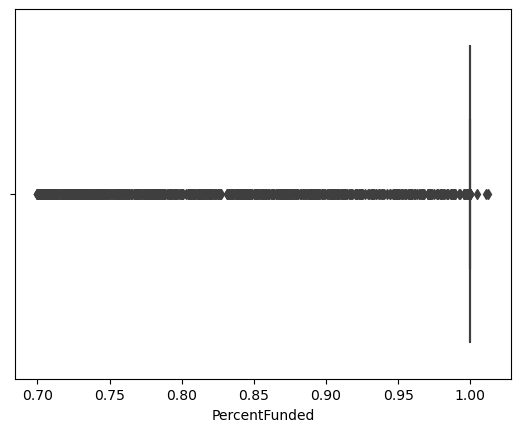

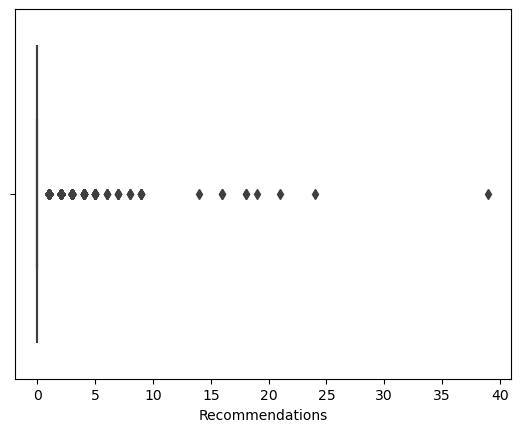

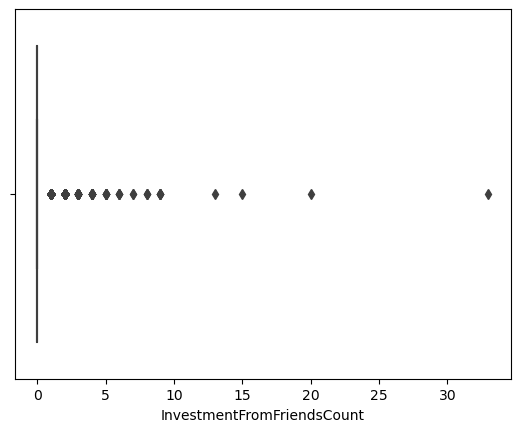

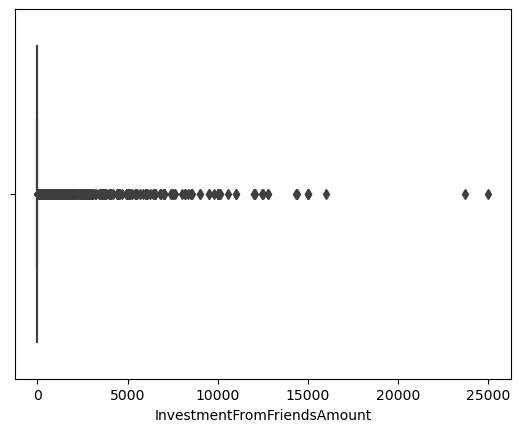

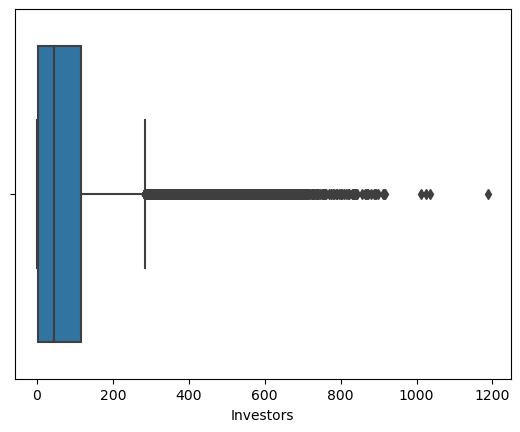

In [13]:
for i in num_cols:
    plt.figure()
    sns.boxplot(data[i])

In [14]:
for i in num_cols :

    Q3 = data[i].quantile(.75)
    Q1 = data[i].quantile(.25)
    IQR = Q3 - Q1 

    upper_whisker = Q3 + 1.5 * IQR
    lower_whisker = Q1 - 1.5 * IQR

    filt2 = data[i] >  upper_whisker 
    filt3 = data[i] <  lower_whisker

    out2 = data[filt2].index
    out3 = data[filt3].index

    data = data.drop(out2 , axis = 0)
    data= data.drop(out3 , axis = 0)


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5279 entries, 13 to 113922
Data columns (total 81 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ListingKey                           5279 non-null   object 
 1   ListingNumber                        5279 non-null   int64  
 2   ListingCreationDate                  5279 non-null   object 
 3   CreditGrade                          5279 non-null   object 
 4   Term                                 5279 non-null   int64  
 5   LoanStatus                           5279 non-null   object 
 6   ClosedDate                           5279 non-null   object 
 7   BorrowerAPR                          5279 non-null   float64
 8   BorrowerRate                         5279 non-null   float64
 9   LenderYield                          5279 non-null   float64
 10  EstimatedEffectiveYield              5279 non-null   float64
 11  EstimatedLoss              

### 3. Missing Data Entry

In [16]:
data['IncomeRange'].unique()

array(['$50,000-74,999', '$75,000-99,999', '$25,000-49,999', '$1-24,999',
       '$100,000+', '$0', 'Not employed', 'Not displayed'], dtype=object)

In [17]:
disp = data[data['IncomeRange'] == 'Not displayed'].index
emp = data[data['IncomeRange'] == 'Not employed'].index

In [18]:
data.drop(disp , axis = 0 , inplace=True)
data.drop(emp , axis = 0 , inplace=True)

### 4. Drop irrelevant variables

In [19]:
lis = ['ListingKey' , 'ListingNumber' , 'GroupKey' , 'LoanKey' , 'LoanNumber' , 'MemberKey'  ]
for i in lis:

    data.drop(i , axis = 1 , inplace=True)

### 5. Date Format

In [20]:
data['ListingCreationDate'] = pd.to_datetime(data['ListingCreationDate'])

In [21]:
data['ClosedDate'] = pd.to_datetime(data['ClosedDate'])

In [22]:
data['DateCreditPulled'] = pd.to_datetime(data['DateCreditPulled'])

In [23]:
data['FirstRecordedCreditLine'] = pd.to_datetime(data['FirstRecordedCreditLine'])

In [24]:
data['LoanOriginationDate'] = pd.to_datetime(data['LoanOriginationDate'])

# EDA

## Bar plots for all categorical variables

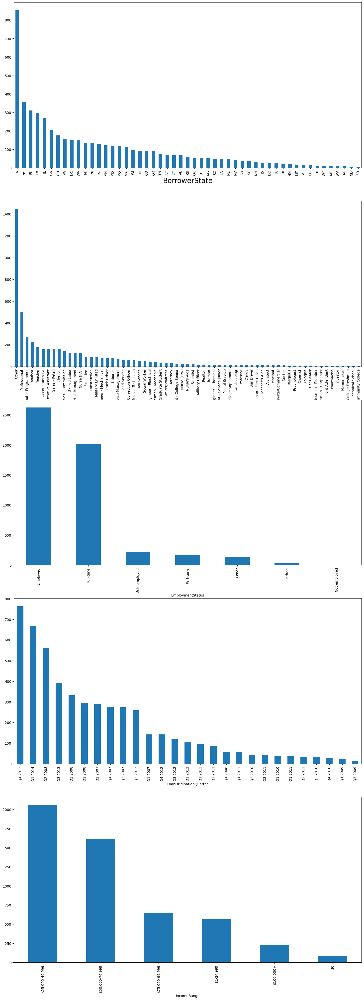

In [25]:
plt.figure(figsize=(18,50))
plt.subplot(5,1,1)
data['BorrowerState'].value_counts().plot.bar()
plt.xlabel('BorrowerState', fontsize=20)

plt.subplot(5,1,2)
data['Occupation'].value_counts().plot.bar()
plt.xlabel('Occupation', fontsize=20)

plt.subplot(5,1,3)
data['EmploymentStatus'].value_counts().plot.bar()
plt.xlabel('EmploymentStatus', fontsize=10)

plt.subplot(5,1,4)
data['LoanOriginationQuarter'].value_counts().plot.bar()
plt.xlabel('LoanOriginationQuarter', fontsize=10)

plt.subplot(5,1,5)
data['IncomeRange'].value_counts().plot.bar()
plt.xlabel('IncomeRange', fontsize=10);  

# Scatter Plots

In [26]:
num = data.select_dtypes('number').columns.to_list()
#numeric dataframe
BM_num =  data[num]

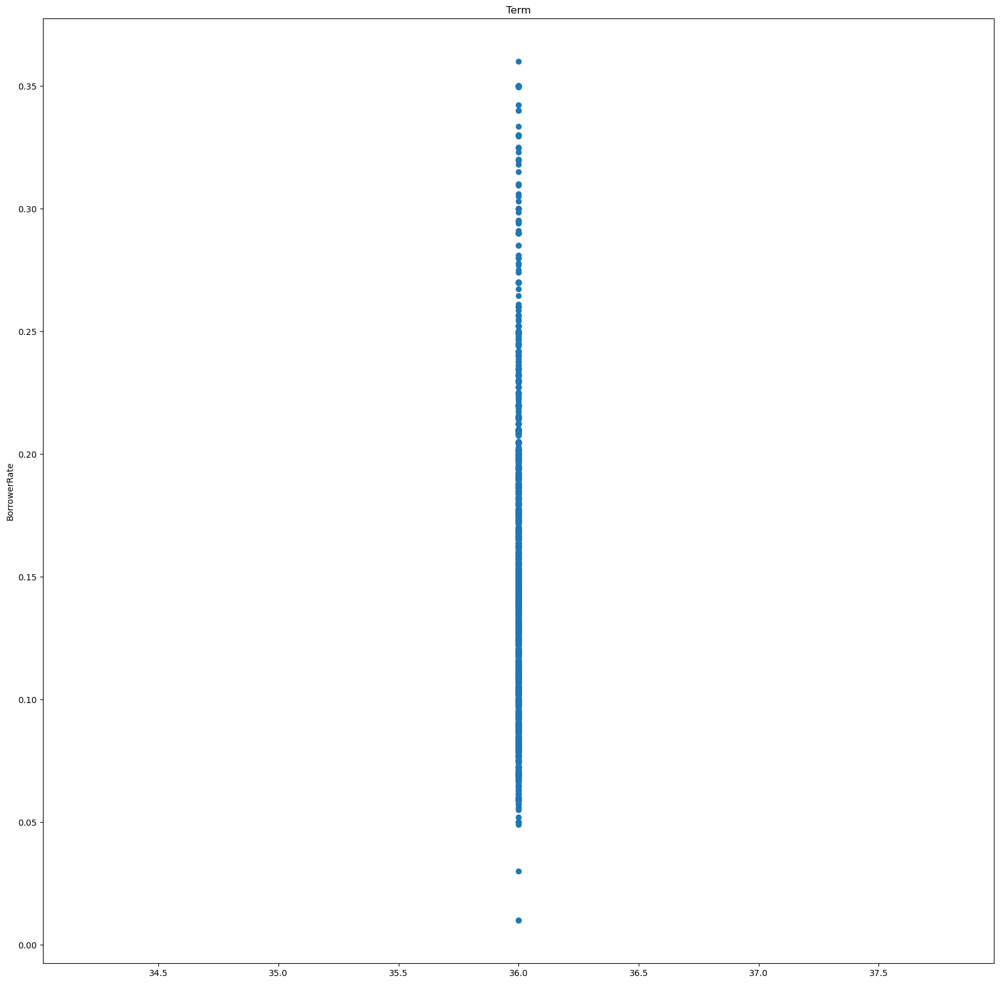

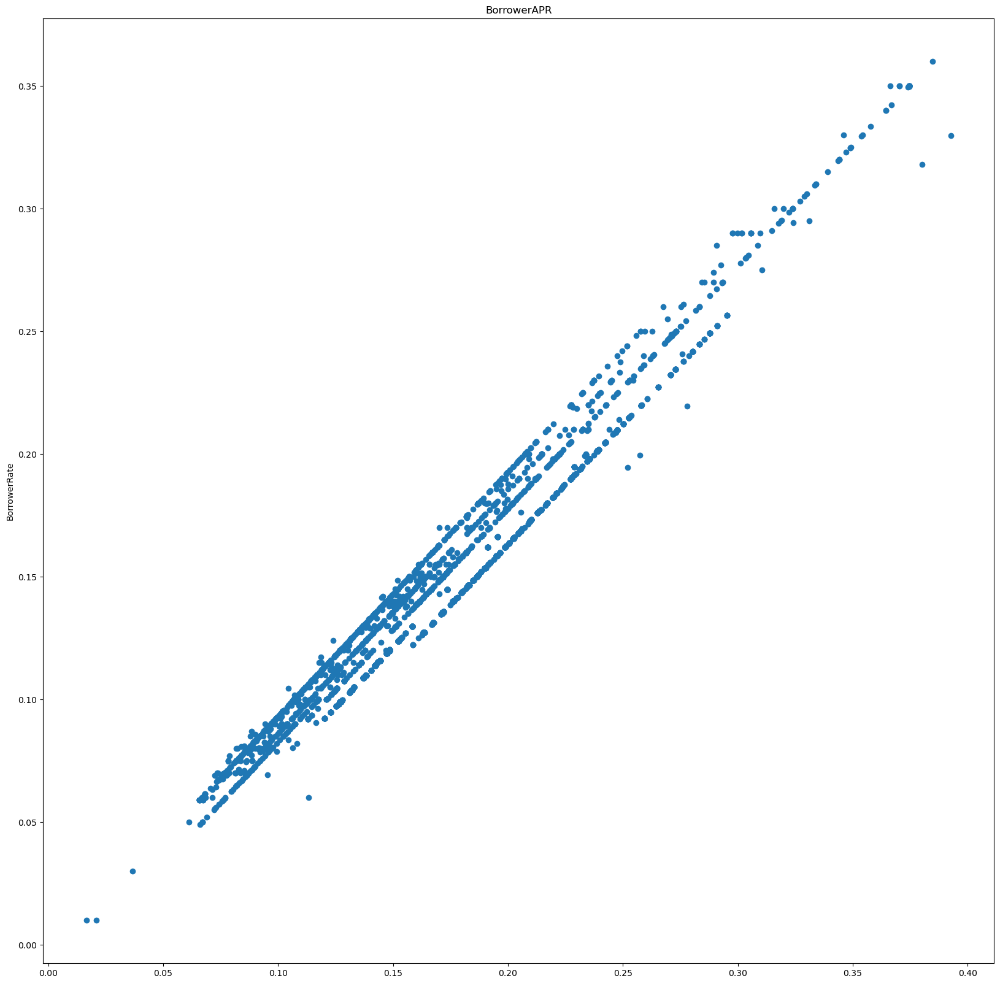

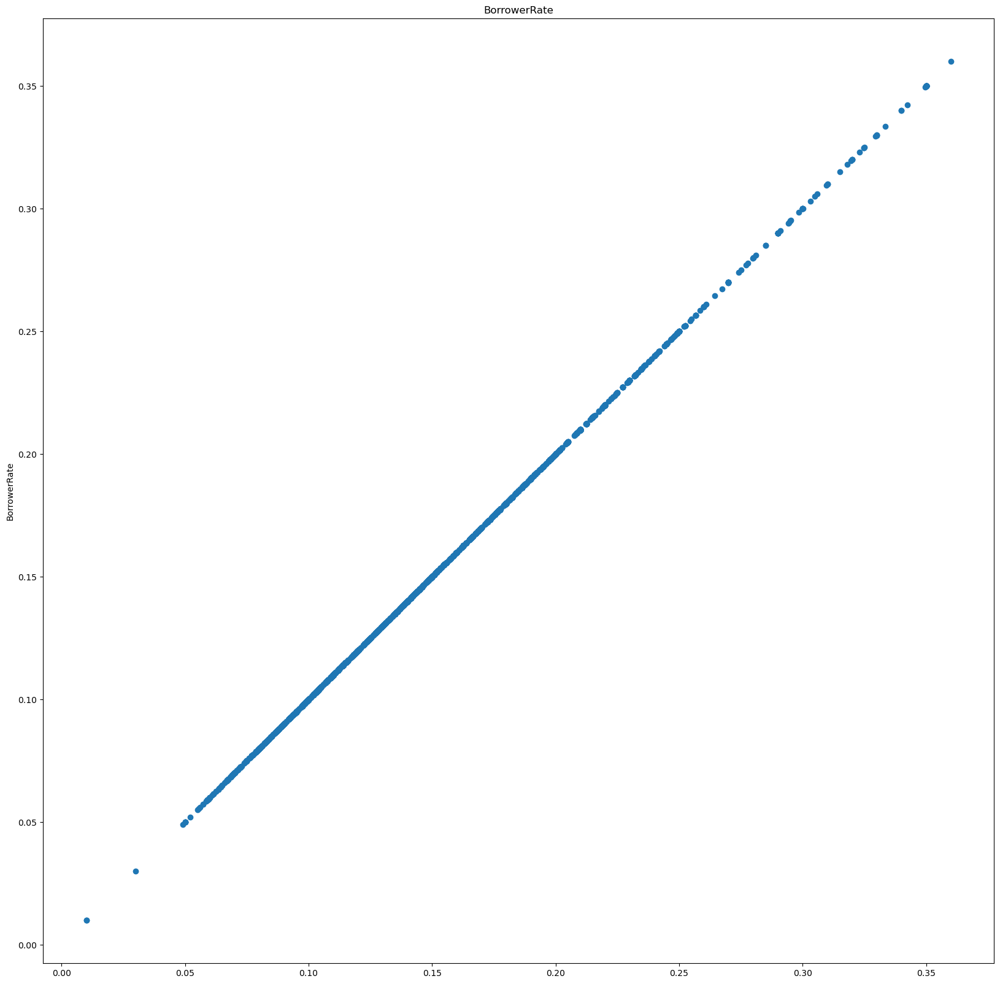

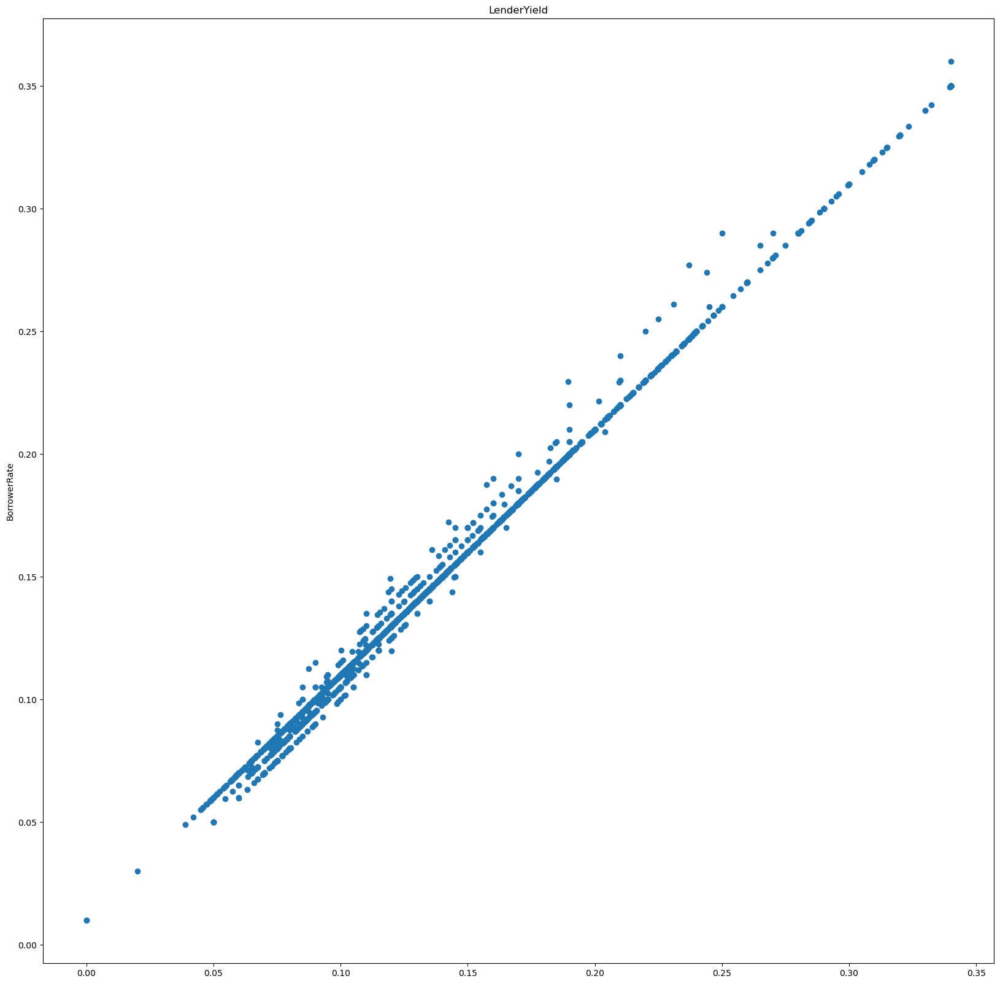

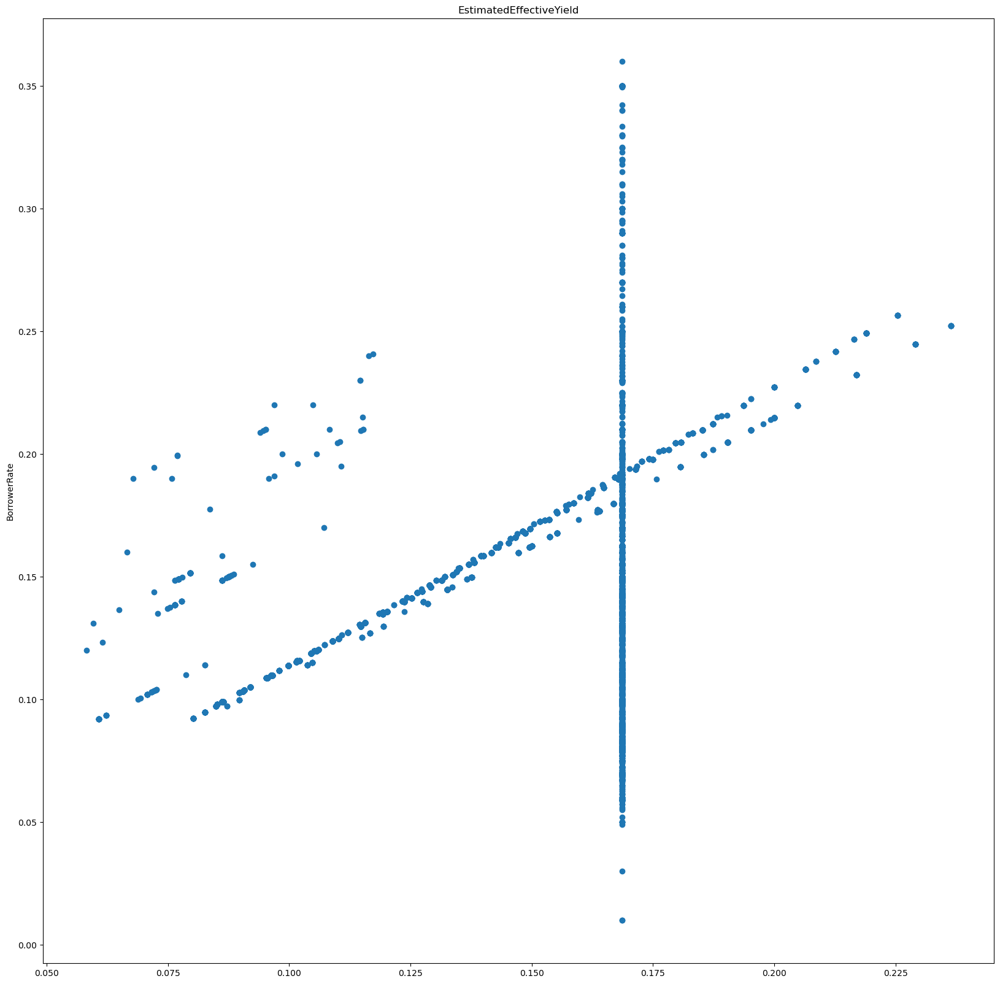

...

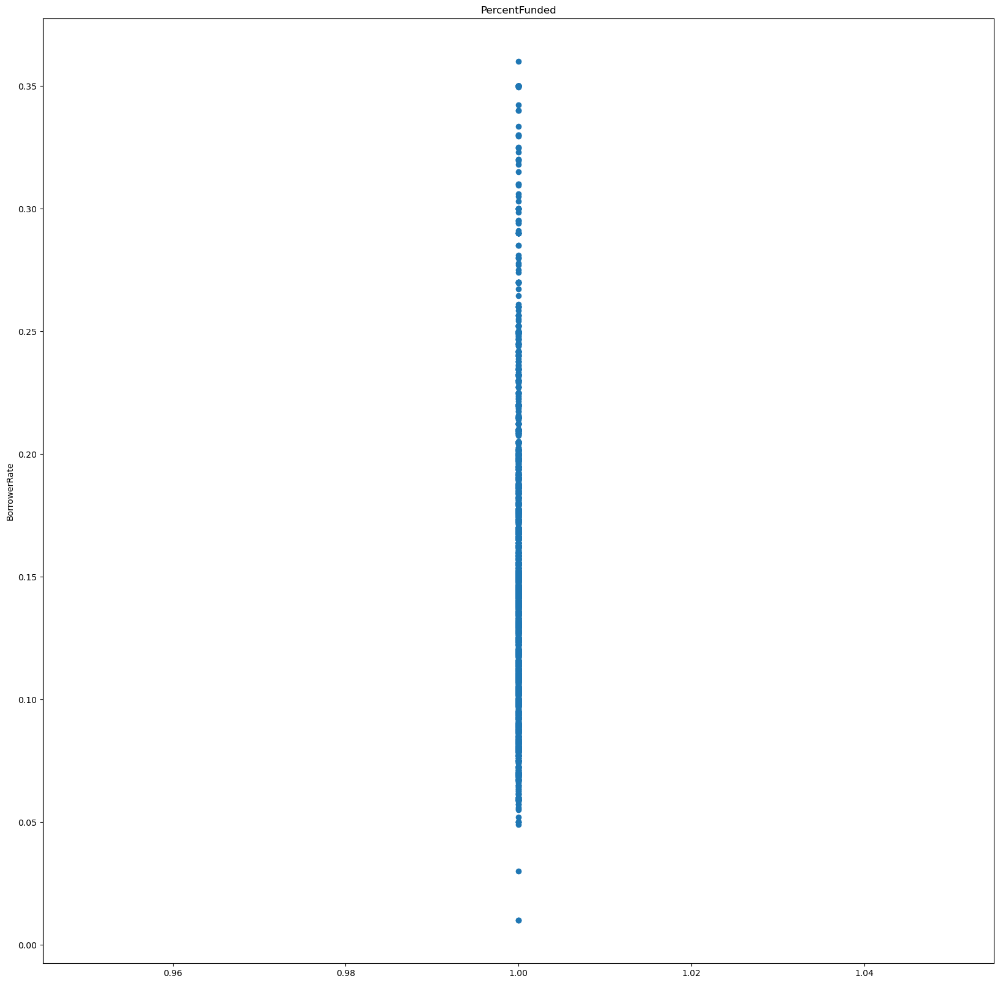

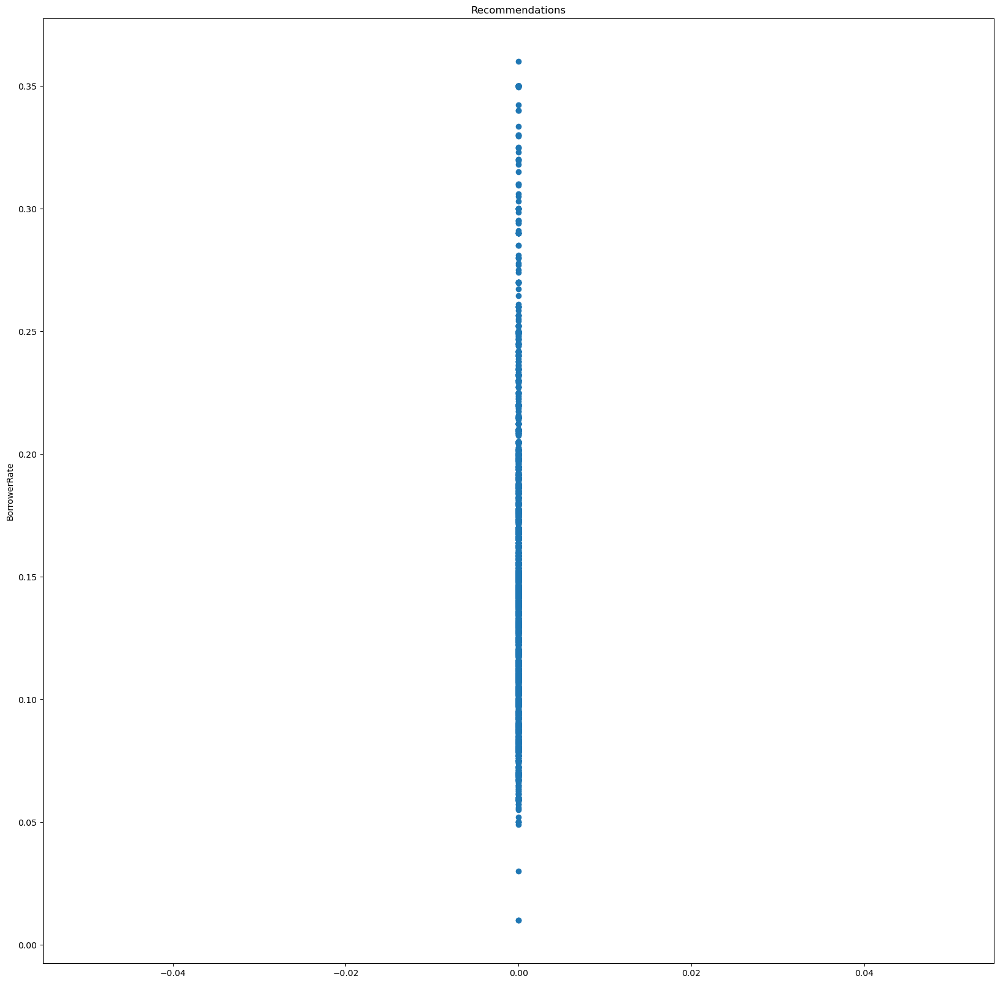

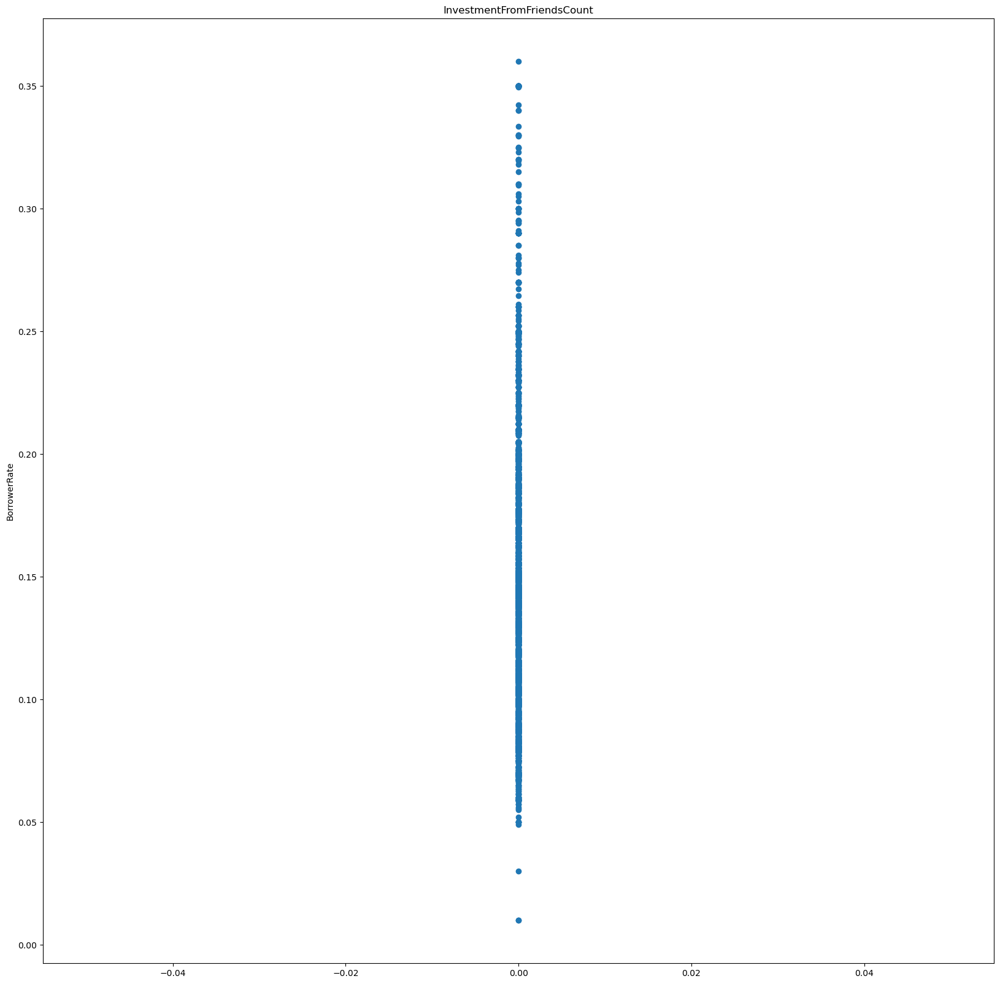

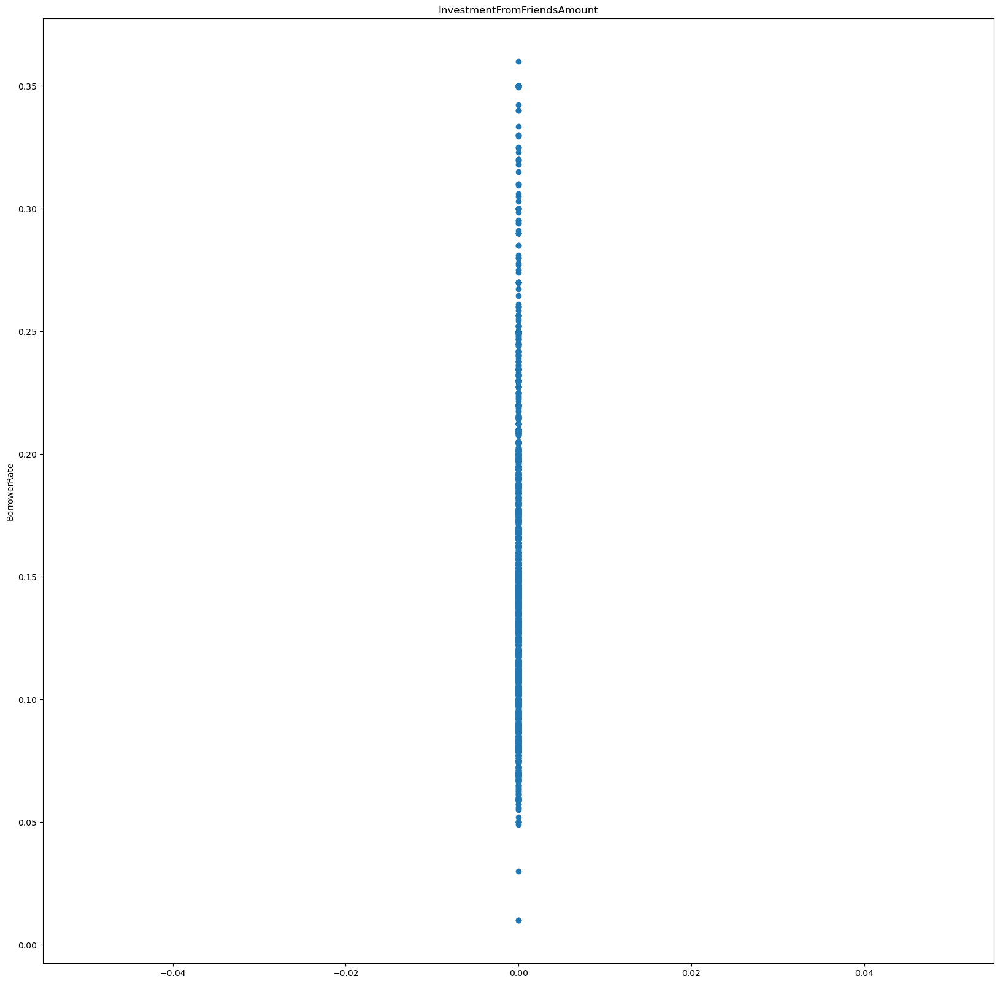

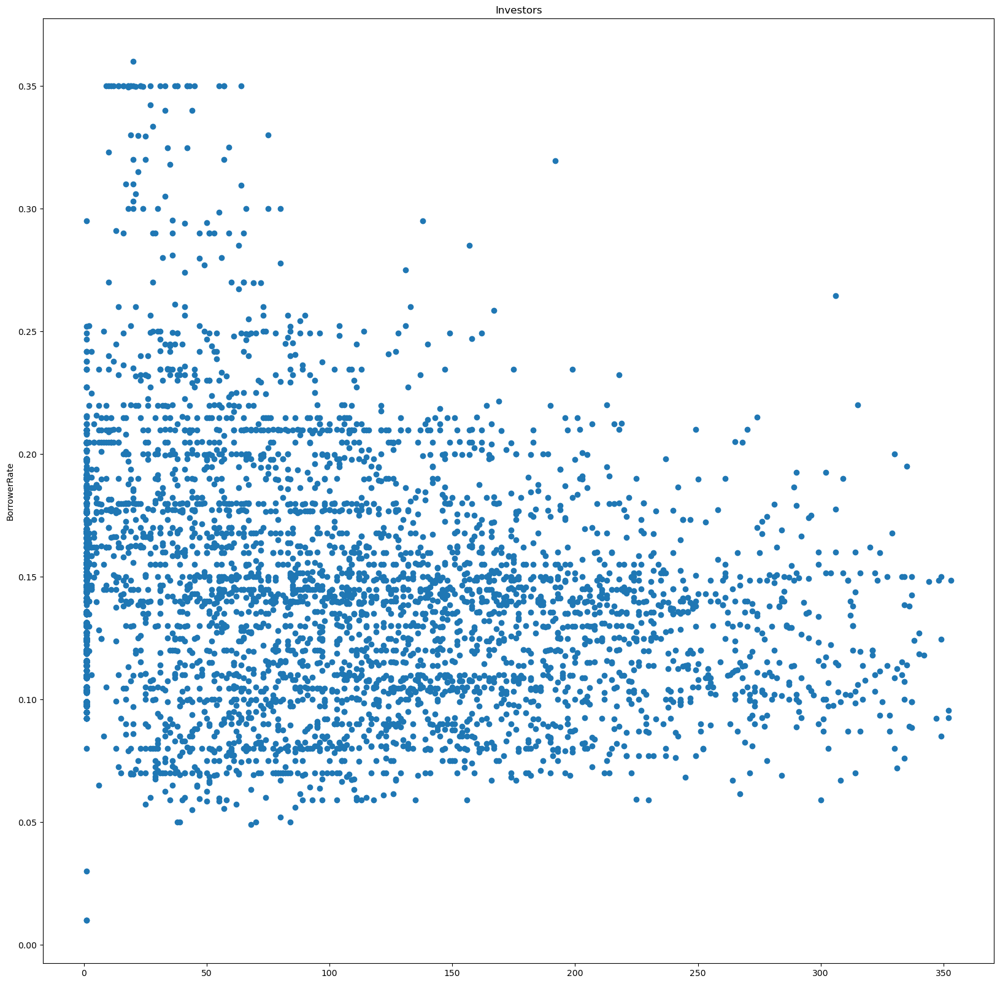

In [27]:
for numeric in num:
    plt.figure(figsize=(20,20))
    plt.scatter(BM_num[numeric], BM_num['BorrowerRate'])
    plt.title(numeric)
    plt.ylabel('BorrowerRate')
    plt.show()

In [28]:
data.corr().abs()

,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,ListingCategory (numeric),EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
Term,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BorrowerAPR,NaN,1.000000,0.980239,0.978164,0.267784,0.240353,0.243328,0.262650,0.006463,0.083850,0.039937,0.130512,0.130653,0.512235,0.512235,0.046418,0.076107,0.005920,0.075379,0.147024,0.100286,0.102301,0.058254,0.062504,0.032991,NaN,NaN,0.095232,0.370624,0.330651,0.011554,0.079373,0.036662,0.246295,0.057214,0.055162,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.257421,0.006733,0.080528,0.039884,0.109786,0.300403,0.084217,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.218332
BorrowerRate,NaN,0.980239,1.000000,0.998620,0.370192,0.359487,0.359934,0.366616,0.048264,0.077838,0.015898,0.160879,0.059455,0.552845,0.552845,0.002988,0.014210,0.062793,0.024599,0.084301,0.164512,0.148394,0.062241,0.066848,0.032087,NaN,NaN,0.045769,0.341601,0.339223,0.071305,0.107178,0.071099,0.218367,0.070174,0.117844,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.079164,0.079002,0.006231,0.066628,0.000837,0.354628,0.128386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.136770
LenderYield,NaN,0.978164,0.998620,1.000000,0.380577,0.369957,0.370100,0.376794,0.051907,0.080548,0.015439,0.159036,0.071515,0.541867,0.541867,0.004703,0.011681,0.063118,0.023141,0.079075,0.164069,0.145821,0.060499,0.065913,0.032269,NaN,NaN,0.041434,0.332251,0.330682,0.071266,0.106314,0.071247,0.213686,0.068715,0.117241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.073446,0.082668,0.009742,0.070872,0.005669,0.354801,0.119451,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.135542
EstimatedEffectiveYield,NaN,0.267784,0.370192,0.380577,1.000000,0.935998,0.926253,0.899748,0.375330,0.056588,0.187028,0.192835,0.197201,0.257278,0.257278,0.171617,0.206711,0.228106,0.156154,0.197996,0.192322,0.129208,0.022120,0.030231,0.009642,NaN,NaN,0.166183,0.023126,0.120132,0.238511,0.151951,0.104001,0.037128,0.027538,0.249057,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.586863,0.405662,0.359498,0.371605,0.354730,0.335637,0.190550,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.183565
EstimatedLoss,NaN,0.240353,0.359487,0.369957,0.935998,1.000000,0.910433,0.964117,0.356690,0.071844,0.216433,0.195512,0.220650,0.257962,0.257962,0.198459,0.240167,0.251506,0.193528,0.234266,0.218088,0.156033,0.012133,0.026154,0.007986,NaN,NaN,0.191272,0.046802,0.118498,0.265447,0.159413,0.106490,0.043141,0.035310,0.281125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.679137,0.457977,0.416136,0.409109,0.400405,0.323194,0.185141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.262323
EstimatedReturn,NaN,0.243328,0.359934,0.370100,0.926253,0.910433,1.000000,0.8754

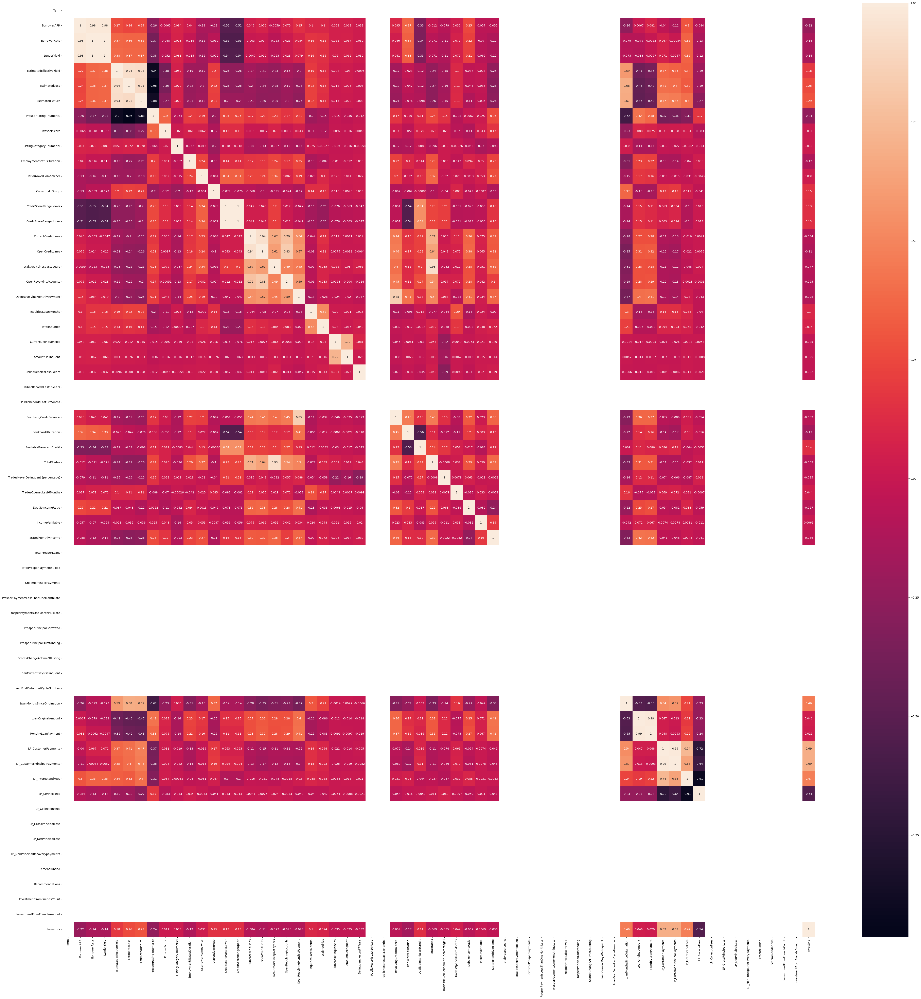

In [29]:
plt.figure(figsize=(60,60)) 
sns.heatmap(data.corr(),annot = True)
plt.show()

## What are the most number of borrowers Credit Grade?

In [30]:
data['CreditGrade'].describe()

count     5212
unique       7
top          C
freq      3403
Name: CreditGrade, dtype: object

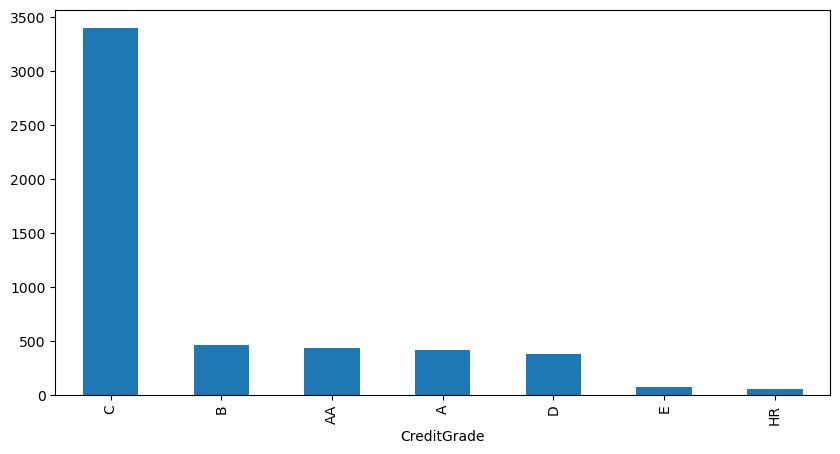

In [31]:
plt.figure(figsize=(10,5))
data['CreditGrade'].value_counts().plot.bar()
plt.xlabel('CreditGrade', fontsize=10); 

## The highest is : c

### Since there are so much low Credit Grade such as C and D , does it lead to a higher amount of deliquency?

Text(0.5, 0, 'LoanStatus')

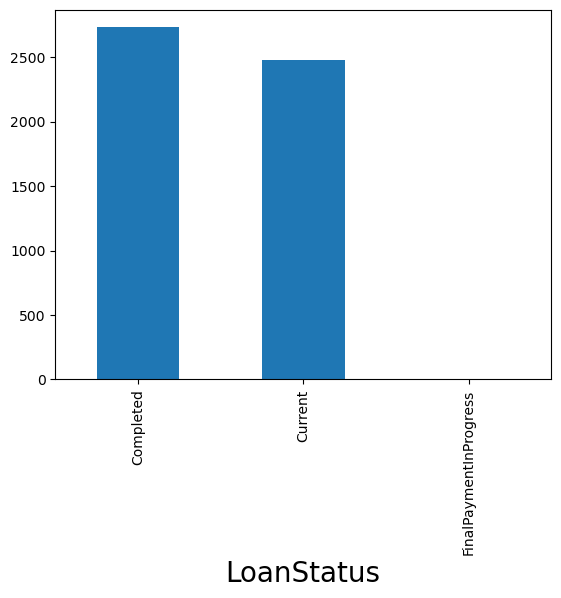

In [32]:
data['LoanStatus'].value_counts().plot.bar()
plt.xlabel('LoanStatus', fontsize=20)

 ## no, Past due has low values

##  What is the highest number of BorrowerRate?

In [33]:
data['BorrowerRate'].describe()

count    5212.000000
mean        0.142970
std         0.047307
min         0.010000
25%         0.109900
50%         0.137000
75%         0.167900
max         0.360000
Name: BorrowerRate, dtype: float64

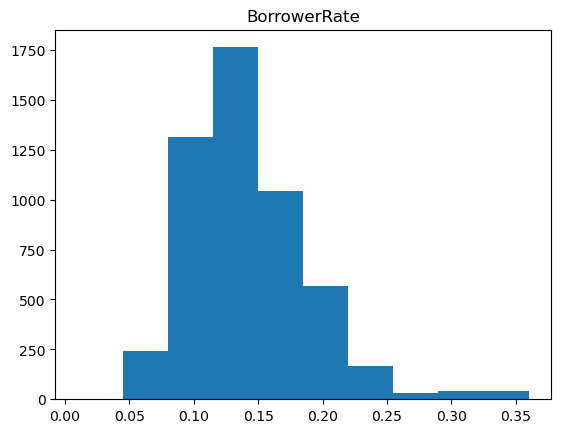

In [34]:
#histogram for numerc columns 
plt.hist(data['BorrowerRate'])
plt.title("BorrowerRate")
plt.show()

##  Highest number is between 0.1 and 0.2

### Since the highest number of Borrower Rate is between 0.1 and 0.2, does the highest number of Lender Yield is between 0.1 and 0.2?

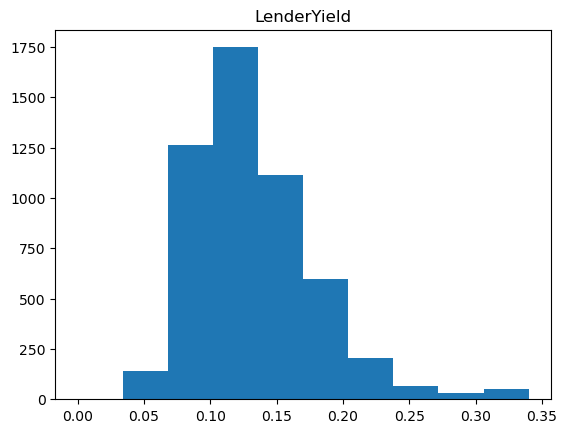

In [35]:
plt.hist(data['LenderYield'])
plt.title("LenderYield")
plt.show()

## Yes ,The highest number of Lender Yield is between 0.1 and 0.2

### Is the Credit Grade really accurate? Does higher Credit Grade leads to higher Monthly Loan Payment? As for Higher Credit Grade we mean from Grade AA to B

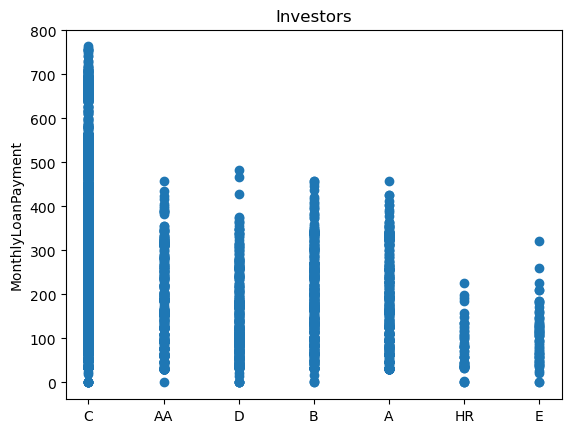

In [36]:
plt.scatter(data['CreditGrade'], data['MonthlyLoanPayment'])
plt.title(numeric)
plt.ylabel('MonthlyLoanPayment')
plt.show()

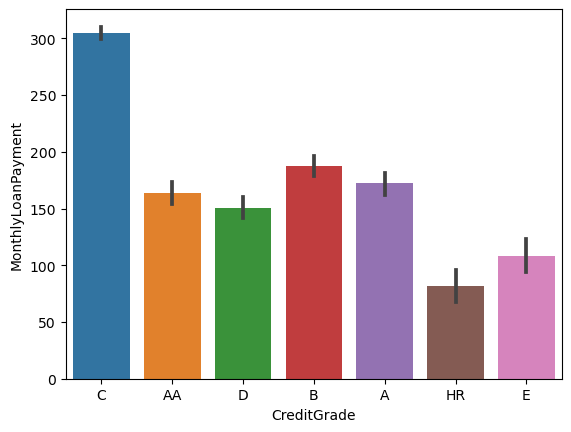

In [37]:
sns.barplot(x='CreditGrade', y='MonthlyLoanPayment', data=data);

##  No, Higher Credit Grade doesn't lead to higher monthly loan payment 

### credit grade seems to be accurate because defaulted borrowers have lower credit grade ('D') than completed 

### Now we know the Credit Grade is accurate and is a tool that is used by the organization in determining the person’s creditworthiness. Now we need to understand does the ProsperScore, the custom built risk assesment system is being used in determing borrower’s rate?

### From a theoretical standpoint, if the higher ProsperScore leads to lower Borrower Rate and Borrower Annual Percentage Rate that means the Prosper Score is being used alongside the Credit Grade in determing a person’s creditworthiness. 

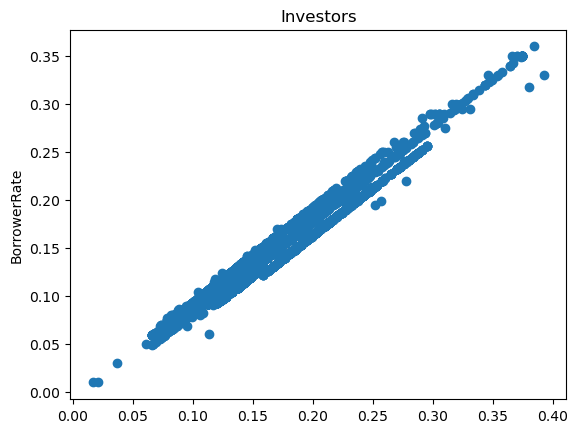

In [38]:
plt.scatter(data['BorrowerAPR'], data['BorrowerRate'])
plt.title(numeric)
plt.ylabel('BorrowerRate')
plt.show()

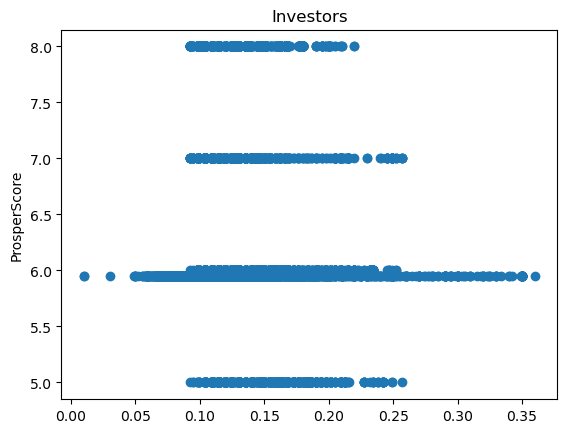

In [39]:
plt.scatter(data['BorrowerRate'], data['ProsperScore'])
plt.title(numeric)
plt.ylabel('ProsperScore')
plt.show()

In [40]:
data['BorrowerRate'].corr(data['ProsperScore'])

-0.048264237946814004

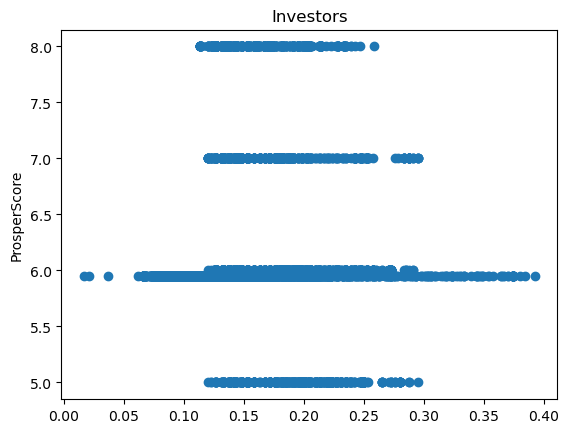

In [41]:
plt.scatter(data['BorrowerAPR'], data['ProsperScore'])
plt.title(numeric)
plt.ylabel('ProsperScore')
plt.show()

In [42]:
data['BorrowerAPR'].corr(data['ProsperScore'])

-0.0064630277450540554

### Borrower APR and BorrowerRate are directly correlated but Borrower APR and Prosper score are inversely correlated this means that when prosper score increases borrower apr decreases and borrower rate also increases

# Label encoding 

In [43]:
from sklearn.preprocessing import LabelEncoder
lb= LabelEncoder()

In [44]:
from sklearn.preprocessing import LabelEncoder
lb= LabelEncoder()

col = ['CreditGrade' , 'ProsperRating (Alpha)' ,'EmploymentStatus' , 
       'BorrowerState','Occupation' ,  'LoanOriginationQuarter' , 'LoanStatus']
for i in col:

    data[i] = lb.fit_transform(data[i] )

# One Hot Encoding

In [45]:
lis = ['IsBorrowerHomeowner' , 'CurrentlyInGroup' ,'IncomeVerifiable' ]
for i in lis :
    data[data[i] == True] = 1
    data[data[i] == False] = 0    

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5212 entries, 13 to 113922
Data columns (total 75 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ListingCreationDate                  5212 non-null   object 
 1   CreditGrade                          5212 non-null   int64  
 2   Term                                 5212 non-null   int64  
 3   LoanStatus                           5212 non-null   int64  
 4   ClosedDate                           5212 non-null   object 
 5   BorrowerAPR                          5212 non-null   float64
 6   BorrowerRate                         5212 non-null   float64
 7   LenderYield                          5212 non-null   float64
 8   EstimatedEffectiveYield              5212 non-null   float64
 9   EstimatedLoss                        5212 non-null   float64
 10  EstimatedReturn                      5212 non-null   float64
 11  ProsperRating (numeric)    

In [47]:
data.head()

,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
13,1,1,1,1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1,1.0,1,1,1,1,1.0,1,1,1,1.0,1.0,1,1.0,1.0,1.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1,1.0,1,1,1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1,1,1.0,1
18,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0,0,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0
35,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0,0,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0
43,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0,0,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0
59,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0,0,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0


In [48]:
data.to_csv(r'/Users/ahmed/Downloads/Data after up/data.csv')